<a href="https://colab.research.google.com/github/adityaraghavan98/camm_hackathon/blob/k4my4r/docs/day_16_11092026/Aditya_boundary_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ATHENA CAMM Hackathon 01
## Boundary Detection + Atom Finding

**September 2026**

A scientific algorithm should not only work once. It should be **explainable, testable, fast, consistent, and robust**.

### Challenge 1 — Boundary Detection
- Dataset: **SiSb**
- Input: **12 HAADF-STEM images**
- Goal: detect the crystalline–amorphous boundary

### Challenge 2 — Atom Finding
- Dataset: **YBCO**
- Input: atomic-resolution STEM images
- Goal: return atomic-column coordinates

All helper functions are kept in:

```text
utils.py
```

The notebook stays focused on the two functions you are asked to improve.

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/kbarakati/athena_camm_hackathon/blob/k4my4r/docs/day_16_11092026/boundary_detection.ipynb)

## 1. Setup

In [ ]:
%pip install -q pyTEMlib ipympl

In [ ]:
# Download only the files needed for this challenge
!git clone -q --filter=blob:none --no-checkout -b k4my4r \
    https://github.com/kbarakati/athena_camm_hackathon.git athena

%cd athena
!git sparse-checkout init --cone
!git sparse-checkout set docs/day_16_11092026
!git checkout -q

%cd docs/day_16_11092026


/content/athena/docs/day_16_11092026/athena
remote: Enumerating objects: 38, done.
remote: Counting objects: 100% (2/2), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 38 (delta 0), reused 0 (delta 0), pack-reused 36 (from 2)
Receiving objects: 100% (38/38), 163.04 MiB | 30.08 MiB/s, done.
/content/athena/docs/day_16_11092026/athena/docs/day_16_11092026


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import ndimage

from utils import (
    resolve_data_dir,
    list_emd_files,
    robust_normalize,
    load_haadf,
    show_image_grid,
    plot_ground_truth_grid,
    plot_boundary_result,
    evaluate_against_ground_truth,
    summarize_accuracy,
    evaluate_robustness,
    summarize_robustness,
    evaluate_speed,
    summarize_speed,
    plot_atom_result,
    validate_atom_output,
    atom_repeatability,
    atom_noise_robustness,
    atom_photometric_robustness,
)

In [ ]:
DATA_DIR = resolve_data_dir()

SISB_DIR = DATA_DIR / "SiSb"
YBCO_DIR = DATA_DIR / "YBCO"
GT_DIR = DATA_DIR / "SiSb_ground_truth"

print("DATA_DIR:", DATA_DIR)
print("SiSb:", SISB_DIR.exists())
print("YBCO:", YBCO_DIR.exists())
print("SiSb ground truth:", GT_DIR.exists())

DATA_DIR: /content/athena/docs/day_16_11092026/athena/docs/day_16_11092026/data
SiSb: True
YBCO: True
SiSb ground truth: True


# Challenge 1 — Boundary Detection

## Goal

Write:

```python
boundary = detect_boundary(image)
```

The function must return a **2D boolean array with the same shape as the input image**.

`True` means that pixel belongs to the predicted crystalline–amorphous boundary.

## 2. Load the SiSb challenge images

In [ ]:
all_sisb_files = list_emd_files(SISB_DIR)

N_SISB = 12
sisb_files = all_sisb_files[:N_SISB]

sisb_images = [
    load_haadf(file)
    for file in sisb_files
]

sisb_titles = [
    file.stem.split("-")[0].strip()
    for file in sisb_files
]

print(f"Using {len(sisb_files)} SiSb images")

Using 12 SiSb images


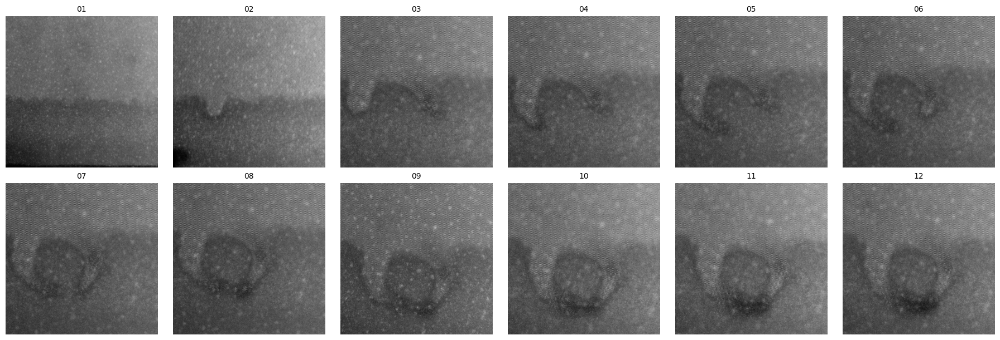

In [ ]:
show_image_grid(
    sisb_images,
    titles=sisb_titles,
    rows=2,
)

### Human ground truth

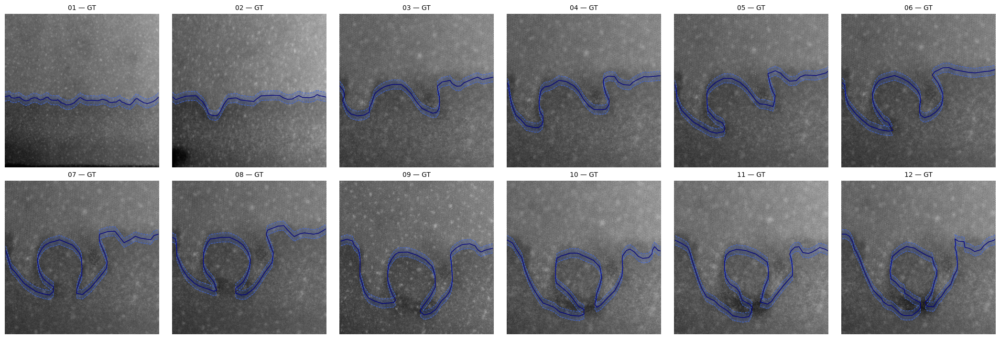

In [ ]:
plot_ground_truth_grid(
    sisb_images,
    sisb_files,
    sisb_titles,
    GT_DIR,
    rows=2,
)

## 3. Build your boundary detector

A simple texture-based baseline is provided.

You may completely replace the code between the two markers.  
Do **not** change the function name, input, or required output format.

In [ ]:
import numpy as np

from scipy import ndimage
from scipy.spatial import cKDTree
from sklearn.cluster import MiniBatchKMeans


def _sisb_normalize(image):
    x = np.asarray(image, dtype=float)
    lo, hi = np.percentile(x, [1.0, 99.5])

    if hi <= lo:
        return np.zeros_like(x, dtype=np.float32)

    return np.clip((x - lo) / (hi - lo), 0, 1).astype(np.float32)


def _sisb_largest_component(mask, connectivity=1):
    structure = ndimage.generate_binary_structure(2, connectivity)
    labels, count = ndimage.label(mask, structure=structure)

    if count == 0:
        return np.zeros_like(mask, dtype=bool)

    sizes = np.bincount(labels.ravel())
    sizes[0] = 0
    return labels == np.argmax(sizes)


def _sisb_boundary_from_mask(mask, spacing):
    boundary = np.zeros_like(mask, dtype=bool)

    changes = mask[:, 1:] != mask[:, :-1]
    boundary[:, 1:] |= changes
    boundary[:, :-1] |= changes

    changes = mask[1:, :] != mask[:-1, :]
    boundary[1:, :] |= changes
    boundary[:-1, :] |= changes

    border = max(15, int(round(2 * spacing)))
    boundary[:border, :] = False
    boundary[-border:, :] = False
    boundary[:, :border] = False
    boundary[:, -border:] = False

    return ndimage.binary_dilation(boundary, iterations=1)


import matplotlib.pyplot as plt


def plot_atomic_diagnostics(
    image, coords, regularity, order_map, density, spacing
):
    x = _sisb_normalize(image)
    py, px = coords[:, 0], coords[:, 1]

    fig, axes = plt.subplots(
        1, 3,
        figsize=(19, 6),
        constrained_layout=True,
    )

    # Detected atomic-column candidates, colored by regularity.
    axes[0].imshow(x, cmap="gray")
    sc = axes[0].scatter(
        px, py,
        c=regularity,
        s=5,
        cmap="viridis",
        vmin=0,
        vmax=1,
        linewidths=0,
    )
    axes[0].set_title(
        f"Atomic-column candidates: {len(coords):,}\n"
        f"Estimated lattice spacing: {spacing:.2f} px"
    )
    fig.colorbar(
        sc, ax=axes[0],
        label="Local atomic-neighborhood regularity",
        shrink=0.8,
    )

    im = axes[1].imshow(
        order_map, cmap="viridis", vmin=0, vmax=1
    )
    axes[1].set_title("Combined structural-order map")
    fig.colorbar(
        im, ax=axes[1], label="Order score", shrink=0.8
    )

    im = axes[2].imshow(
        density, cmap="viridis", vmin=0, vmax=1
    )
    axes[2].set_title("Normalized atomic-column density")
    fig.colorbar(
        im, ax=axes[2], label="Relative density", shrink=0.8
    )

    for ax in axes:
        ax.axis("off")

    plt.show()

def detect_boundary(
    image,
    peak_percentile=55,
    shell_min=0.55,
    shell_max=1.45,
    distance_scale=0.30,
    angular_scale=0.80,
    weak_fraction=0.35,
    density_floor=0.45,
    contour_sigma=0.75,
    principal_interface=True,
    show_diagnostics=False,        # Add this argument
):
    """
    Detect the dominant crystalline/amorphous boundary.

    Parameters use the same defaults for every image.
    Spatial scales adapt to the automatically estimated lattice spacing.

    Returns
    -------
    boundary : 2D Boolean array
        Same shape as the input. True indicates boundary pixels.
    """
    image = np.asarray(image)

    if image.ndim != 2:
        raise ValueError("image must be a 2D array.")

    if not np.all(np.isfinite(image)):
        raise ValueError("image contains NaN or infinite values.")

    empty = np.zeros(image.shape, dtype=bool)
    x = _sisb_normalize(image)
    H, W = x.shape

    # --------------------------------------------------------
    # 1. Estimate lattice spacing from the full-image FFT
    # --------------------------------------------------------
    hp = x - ndimage.gaussian_filter(x, sigma=3.0)

    wy = np.hanning(H).astype(np.float32)
    wx = np.hanning(W).astype(np.float32)
    windowed = hp * wy[:, None] * wx[None, :]

    F = np.fft.fftshift(np.fft.fft2(windowed))
    power = np.log1p(np.abs(F) ** 2)

    fy = np.fft.fftshift(np.fft.fftfreq(H))
    fx = np.fft.fftshift(np.fft.fftfreq(W))
    FX, FY = np.meshgrid(fx, fy)
    radius = np.sqrt(FX**2 + FY**2)

    radial_edges = np.linspace(1.0 / 20.0, 1.0 / 2.5, 180)
    radial_centers = (radial_edges[:-1] + radial_edges[1:]) / 2
    radial_profile = np.zeros(len(radial_centers), dtype=np.float32)

    for j in range(len(radial_centers)):
        ring = (
            (radius >= radial_edges[j])
            & (radius < radial_edges[j + 1])
        )
        if np.any(ring):
            radial_profile[j] = np.mean(power[ring])

    baseline = ndimage.gaussian_filter1d(radial_profile, sigma=8)
    peak_profile = ndimage.gaussian_filter1d(
        radial_profile - baseline, sigma=1
    )

    lattice_frequency = radial_centers[np.argmax(peak_profile)]
    spacing = float(np.clip(1.0 / lattice_frequency, 2.5, 20.0))

    # --------------------------------------------------------
    # 2. Detect candidate atomic columns
    # --------------------------------------------------------
    atom_img = ndimage.gaussian_filter(
        x, sigma=max(0.7, 0.14 * spacing)
    )
    atom_response = atom_img - ndimage.gaussian_filter(
        atom_img, sigma=max(2.0, spacing)
    )

    min_sep = max(2, int(round(0.45 * spacing)))
    local_max = atom_response == ndimage.maximum_filter(
        atom_response,
        size=2 * min_sep + 1,
        mode="reflect",
    )

    positive_response = atom_response[atom_response > 0]
    if positive_response.size == 0:
        return empty

    threshold = np.percentile(positive_response, peak_percentile)
    peaks = local_max & (atom_response > threshold)

    margin = max(3, int(np.ceil(spacing)))
    peaks[:margin, :] = False
    peaks[-margin:, :] = False
    peaks[:, :margin] = False
    peaks[:, -margin:] = False

    py, px = np.where(peaks)
    if len(px) < 20:
        return empty

    coords = np.column_stack([py, px]).astype(np.float32)

    # --------------------------------------------------------
    # 3. Measure local atomic-neighborhood regularity
    # --------------------------------------------------------
    tree = cKDTree(coords)
    distances, neighbor_ids = tree.query(
        coords, k=min(9, len(coords))
    )

    neighbor_distances = distances[:, 1:]
    neighbor_indices = neighbor_ids[:, 1:]
    regularity = np.zeros(len(coords), dtype=np.float32)

    d_min = shell_min * spacing
    d_max = shell_max * spacing

    for j in range(len(coords)):
        ds = neighbor_distances[j]
        ids = neighbor_indices[j]

        use = (ds >= d_min) & (ds <= d_max)
        ds_shell = ds[use]
        ids_shell = ids[use]
        n_shell = len(ds_shell)

        if n_shell < 2:
            continue

        median_d = np.median(ds_shell)
        mad_d = np.median(np.abs(ds_shell - median_d))
        distance_cv = mad_d / (median_d + 1e-8)

        distance_score = np.exp(
            -(distance_cv / distance_scale) ** 2
        )

        vectors = coords[ids_shell] - coords[j]
        angles = np.sort(
            np.mod(
                np.arctan2(vectors[:, 0], vectors[:, 1]),
                2 * np.pi,
            )
        )

        if n_shell >= 3:
            angle_steps = np.diff(
                np.r_[angles, angles[0] + 2 * np.pi]
            )
            expected_step = 2 * np.pi / n_shell
            angle_cv = np.std(angle_steps) / (
                expected_step + 1e-8
            )
            angular_score = np.exp(
                -(angle_cv / angular_scale) ** 2
            )
        else:
            angular_score = 0.5

        coordination_score = np.clip(n_shell / 4.0, 0, 1)

        regularity[j] = (
            0.55 * distance_score
            + 0.30 * angular_score
            + 0.15 * coordination_score
        )

    # --------------------------------------------------------
    # 4. Construct continuous regularity and density maps
    # --------------------------------------------------------
    numerator = np.zeros((H, W), dtype=np.float32)
    denominator = np.zeros((H, W), dtype=np.float32)

    np.add.at(numerator, (py, px), regularity)
    np.add.at(denominator, (py, px), 1.0)

    map_sigma = max(3.0, 1.5 * spacing)
    numerator = ndimage.gaussian_filter(numerator, map_sigma)
    denominator = ndimage.gaussian_filter(denominator, map_sigma)

    regularity_map = numerator / (denominator + 1e-8)

    density_lo, density_hi = np.percentile(
        denominator, [2, 98]
    )
    density = np.clip(
        (denominator - density_lo)
        / (density_hi - density_lo + 1e-8),
        0,
        1,
    )

    valid = denominator > np.percentile(denominator, 10)
    values = regularity_map[valid]

    if values.size == 0:
        return empty

    r_lo, r_hi = np.percentile(values, [2, 98])
    regularity_map = np.clip(
        (regularity_map - r_lo) / (r_hi - r_lo + 1e-8),
        0,
        1,
    )

    order_map = 0.80 * regularity_map + 0.20 * density
    order_map = ndimage.gaussian_filter(
        order_map, sigma=max(1.0, 0.25 * spacing)
    )

    # --------------------------------------------------------
    # 5. Identify the strongly ordered crystalline seed
    # --------------------------------------------------------
    vals = order_map.ravel()
    rng = np.random.default_rng(0)
    sample_ids = rng.choice(
        len(vals), size=min(30000, len(vals)), replace=False
    )

    km = MiniBatchKMeans(
        n_clusters=2,
        n_init=10,
        batch_size=4096,
        random_state=0,
    )
    km.fit(vals[sample_ids, None])

    centers = km.cluster_centers_.ravel()
    ordered_cluster = np.argmax(centers)
    labels = km.predict(vals[:, None]).reshape(H, W)
    strong = labels == ordered_cluster

    filter_width = max(3, int(round(0.5 * spacing)))
    if filter_width % 2 == 0:
        filter_width += 1

    strong = ndimage.uniform_filter(
        strong.astype(np.float32), size=filter_width
    ) > 0.5
    strong = _sisb_largest_component(strong)

    if not np.any(strong):
        return empty

    # --------------------------------------------------------
    # 6. Recover connected, weaker crystalline regions
    # --------------------------------------------------------
    low, high = np.sort(centers)
    weak_threshold = low + weak_fraction * (high - low)

    weak = (
        (order_map > weak_threshold)
        & (density > density_floor)
    )

    grown = ndimage.binary_propagation(
        strong,
        mask=strong | weak,
    )

    grown = ndimage.uniform_filter(
        grown.astype(np.float32), size=filter_width
    ) > 0.5
    grown = _sisb_largest_component(grown)

    # Smooth small contour irregularities at the lattice scale.
    if contour_sigma > 0:
        grown = ndimage.gaussian_filter(
            grown.astype(np.float32),
            sigma=contour_sigma * spacing,
        ) > 0.5
        grown = _sisb_largest_component(grown)

    # --------------------------------------------------------
    # 7. Extract the principal phase interface
    # --------------------------------------------------------
    boundary = _sisb_boundary_from_mask(grown, spacing)

    if principal_interface and np.any(boundary):
        boundary = _sisb_largest_component(
            boundary, connectivity=2
        )

    if show_diagnostics:
        plot_atomic_diagnostics(
            image=image,
            coords=coords,
            regularity=regularity,
            order_map=order_map,
            density=density,
            spacing=spacing,
        )

    return boundary.astype(bool)

## 4. Test one image visually

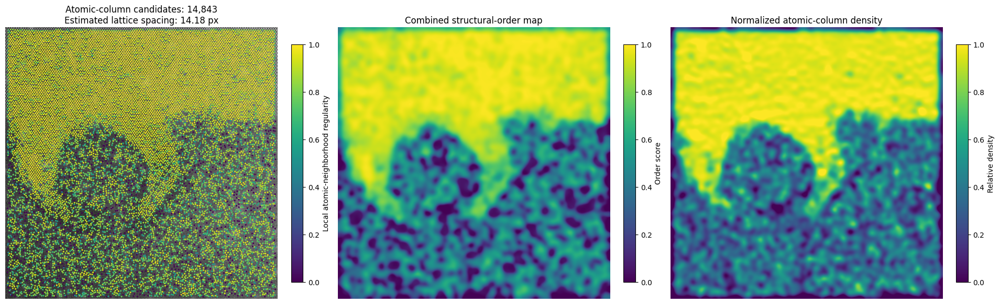

In [ ]:
boundary = detect_boundary(sisb_images[6],
    show_diagnostics=True,)  # Image 07

Processing 1/12
Processing 2/12
Processing 3/12
Processing 4/12
Processing 5/12
Processing 6/12
Processing 7/12
Processing 8/12
Processing 9/12
Processing 10/12
Processing 11/12
Processing 12/12


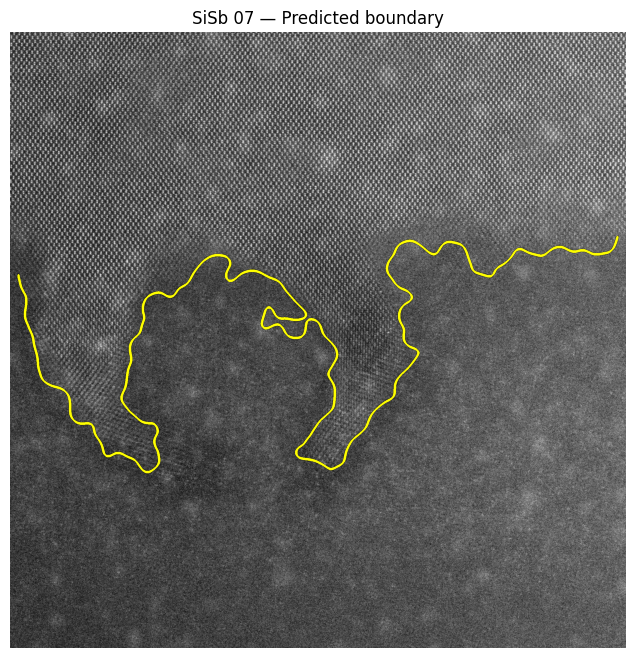

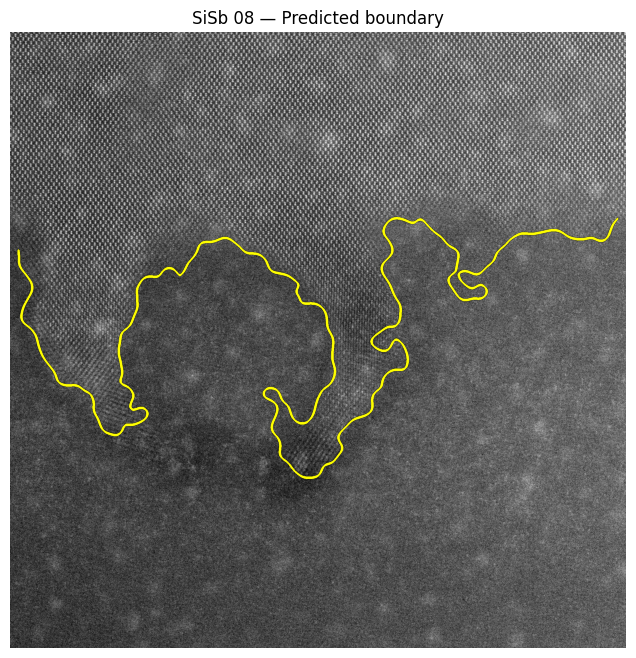

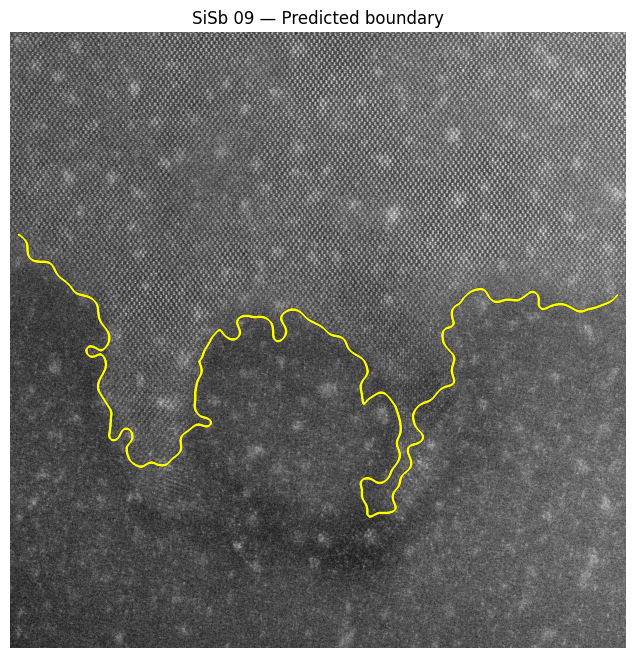

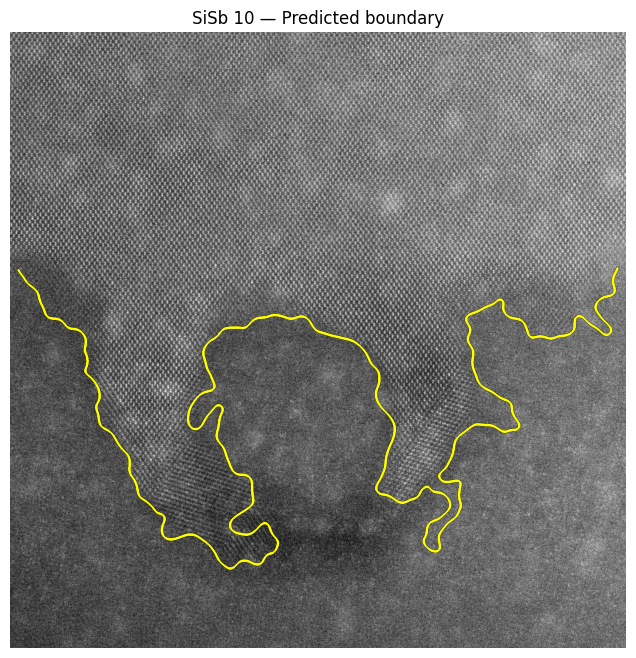

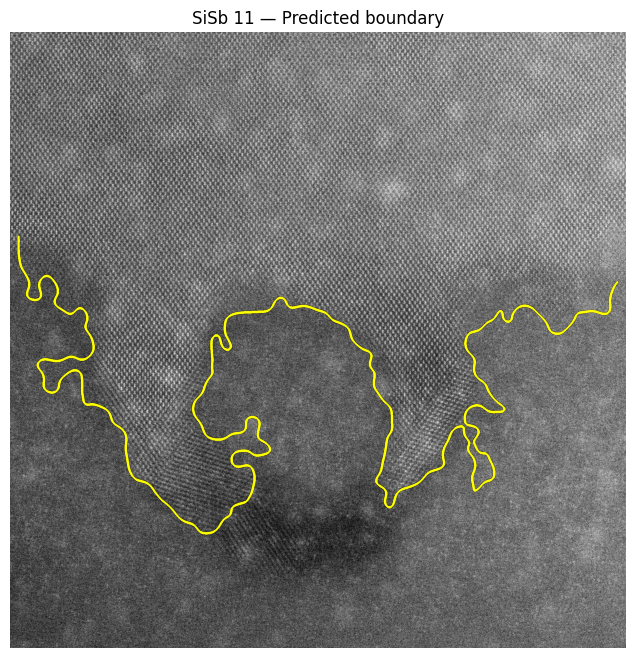

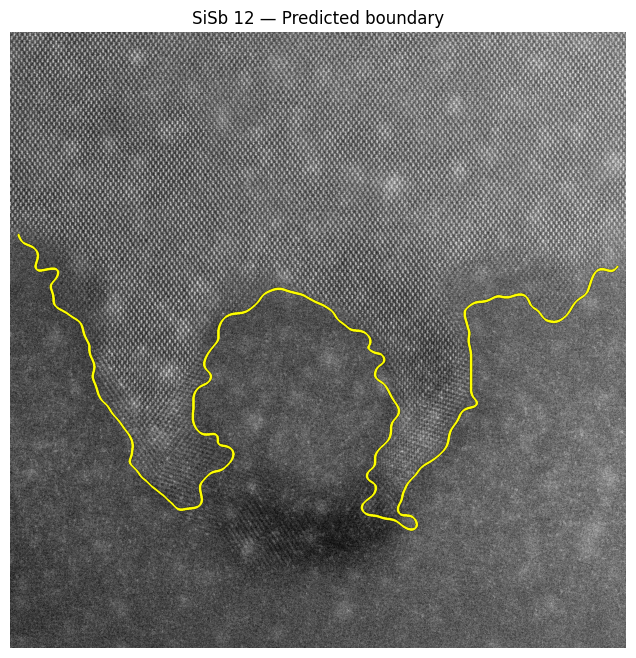

In [ ]:
# Run the same detector, with identical defaults, on every image.
all_boundaries = []

for i, image in enumerate(sisb_images):
    print(f"Processing {i + 1}/{len(sisb_images)}")
    all_boundaries.append(detect_boundary(image))

# Display the difficult cases 07–12.
for i in range(6, min(12, len(sisb_images))):
    plot_boundary_result(
        sisb_images[i],
        all_boundaries[i],
        title=f"SiSb {sisb_titles[i]} — Predicted boundary",
    )

## 5. Challenge 1 evaluation

We evaluate only three things:

### 1. Accuracy against human ground truth
Predictions are compared with the hand-drawn boundary using a spatial tolerance. Exact single-pixel agreement is not required.

Primary metric: **F1 @ 5 px tolerance**

### 2. Robustness
The same detector is tested after controlled perturbations:
- Gaussian noise
- Gaussian blur
- brightness change
- contrast change
- inclined intensity background

Every perturbed prediction is compared with the **same human ground truth**.

### 3. Speed
Only `detect_boundary(image)` is timed. File loading, plotting, and scoring are excluded.

### Test 1 — Accuracy against ground truth

In [ ]:
accuracy_results = evaluate_against_ground_truth(
    detect_boundary,
    sisb_images,
    sisb_files,
    sisb_titles,
    GT_DIR,
    tolerance_px=50,
)

accuracy_results

,image,precision,recall,f1,mean_pred_to_gt_distance,mean_gt_to_pred_distance,mean_symmetric_boundary_error
0,01,0.966388,1.000000,0.982907,14.518336,7.620148,11.069242
1,02,0.667322,0.948127,0.783319,44.184027,16.842145,30.513086
2,03,0.918349,0.978556,0.947497,23.099963,18.618713,20.859338
3,04,0.957830,0.978102,0.967860,22.088079,19.985706,21.036893
4,05,0.799490,0.920886,0.855905,33.522411,21.752405,27.637408
5,06,0.747718,0.729629,0.738563,37.260329,44.712421,40.986375
6,07,0.775296,0.823959,0.798887,34.454864,34.094024,34.274444
7,08,0.698668,0.772637,0.733793,45.471921,40.160617,42.816269
8,09,0.720270,0.625069,0.669301,38.203973,64.315504,51.259738
9,10,0.765806,0.851219,0.806257,36.858962,28.067070,32.463016


In [ ]:
summarize_accuracy(
    accuracy_results
)

,Clean boundary accuracy
mean_precision,0.808849
mean_recall,0.848304
mean_f1,0.824644
mean_boundary_error_px,32.667770


In [ ]:
def load_ground_truth(image_file, gt_dir):
    image_file = Path(image_file)
    gt_dir = Path(gt_dir)

    gt_file = gt_dir / f"{image_file.stem}_ground_truth.npz"

    if not gt_file.exists():
        raise FileNotFoundError(
            f"Ground-truth file not found:\n{gt_file}"
        )

    with np.load(gt_file, allow_pickle=False) as data:
        if "boundary_mask" not in data:
            raise KeyError(
                f"{gt_file.name} has no 'boundary_mask'. "
                f"Available keys: {data.files}"
            )

        return data["boundary_mask"].astype(bool)

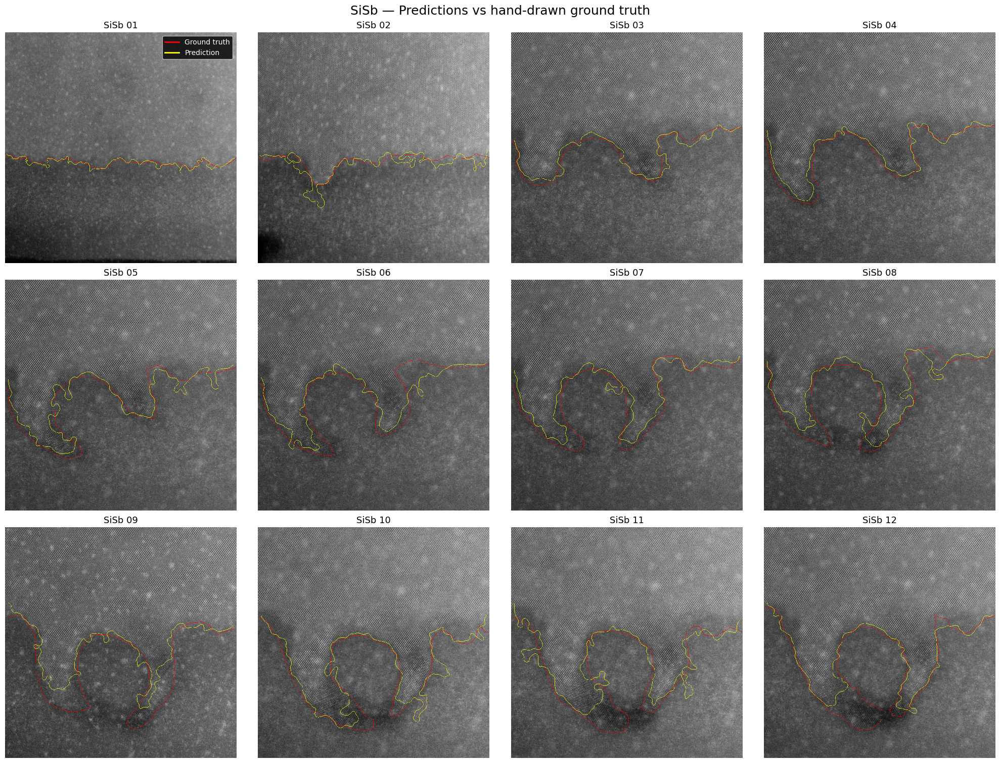

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# Compute predictions using identical defaults for every image.
all_boundaries = [
    detect_boundary(image)
    for image in sisb_images
]

n = len(sisb_images)
cols = 4
rows = int(np.ceil(n / cols))

fig, axes = plt.subplots(
    rows,
    cols,
    figsize=(5 * cols, 5 * rows),
    squeeze=False,
    constrained_layout=True,
)

for i, ax in enumerate(axes.ravel()):
    if i >= n:
        ax.axis("off")
        continue

    image = np.asarray(sisb_images[i])
    pred = np.asarray(all_boundaries[i], dtype=bool)
    gt = np.asarray(
        load_ground_truth(sisb_files[i], GT_DIR),
        dtype=bool,
    )

    if image.shape != pred.shape or image.shape != gt.shape:
        raise ValueError(f"Shape mismatch for image {sisb_titles[i]}")

    lo, hi = np.percentile(image, [1, 99.5])
    ax.imshow(image, cmap="gray", vmin=lo, vmax=hi)

    # Plot masks at their original pixel coordinates.
    # Transparency lets overlapping boundaries remain visible.
    overlay = np.zeros((*image.shape, 4), dtype=np.float32)
    overlay[gt] = [1.0, 0.0, 0.0, 0.85]
    ax.imshow(overlay, interpolation="nearest")

    overlay = np.zeros((*image.shape, 4), dtype=np.float32)
    overlay[pred] = [1.0, 1.0, 0.0, 0.75]
    ax.imshow(overlay, interpolation="nearest")

    ax.set_title(f"SiSb {sisb_titles[i]}", fontsize=13)
    ax.axis("off")

legend_handles = [
    Line2D([0], [0], color="red", lw=2, label="Ground truth"),
    Line2D([0], [0], color="yellow", lw=2, label="Prediction"),
]

axes.ravel()[0].legend(
    handles=legend_handles,
    loc="upper right",
    facecolor="black",
    labelcolor="white",
    framealpha=0.8,
)

fig.suptitle(
    "SiSb — Predictions vs hand-drawn ground truth",
    fontsize=18,
)

# Optional: save the complete comparison.
# fig.savefig("sisb_predictions_vs_gt.png", dpi=200, bbox_inches="tight")

plt.show()

### Test 2 — Robustness

In [ ]:
robustness_results = evaluate_robustness(
    detect_boundary,
    sisb_images,
    sisb_files,
    sisb_titles,
    GT_DIR,
    tolerance_px=5,
    max_images=4,
)

robustness_summary = summarize_robustness(
    robustness_results
)

robustness_summary

,condition,mean_f1,std_f1,mean_precision,mean_recall,mean_boundary_error_px,f1_drop_from_clean
0,Clean,0.196614,0.128252,0.179506,0.219405,27.159218,0.000000
1,Gaussian noise 5%,0.223169,0.104973,0.198399,0.262201,27.672551,-0.026555
2,Gaussian blur sigma=1,0.194130,0.102695,0.178265,0.213807,25.088802,0.002484
3,Brightness +10%,0.196614,0.128252,0.179506,0.219405,27.159218,0.000000
4,Contrast -20%,0.196614,0.128252,0.179506,0.219405,27.159218,0.000000
5,Intensity gradient 20%,0.204760,0.131543,0.187632,0.227027,26.883151,-0.008147


Interpretation:

- `mean_f1`: accuracy under that condition
- `mean_boundary_error_px`: average symmetric distance to the human boundary
- `f1_drop_from_clean`: performance lost relative to the clean images

**Smaller F1 drop is better.**

### Test 3 — Speed

In [ ]:
speed_results = evaluate_speed(
    detect_boundary,
    sisb_images,
    repeats=5,
)

summarize_speed(
    speed_results
)

,Speed
mean_seconds_per_image,11.444249
median_seconds_per_image,10.810952
slowest_seconds,18.250898
images_per_second,0.087380


# Challenge 2 — Atom Finding in YBCO

## Goal

Write:

```python
positions = find_atoms(image)
```

The function must return a NumPy array of shape `(N, 2)`.

Each row is:

```text
[y, x]
```

in pixel coordinates.

## 6. Load YBCO

In [ ]:
ybco_files = list_emd_files(YBCO_DIR)

ybco_images = [
    load_haadf(file)
    for file in ybco_files
]

ybco_titles = [
    file.stem
    for file in ybco_files
]

print(f"Found {len(ybco_images)} YBCO images")

if ybco_images:
    show_image_grid(
        ybco_images,
        titles=[
            str(i + 1)
            for i in range(len(ybco_images))
        ],
        rows=1 if len(ybco_images) > 1 else 1,
    )

## 7. Build your atom finder

A simple local-maximum baseline is provided.

You may completely replace the code between the two markers.

In [ ]:
def find_atoms(image):

    # ============================================================
    # ===== YOUR CODE START — CHANGE CODE BELOW THIS LINE =====
    # ============================================================

    # 1. Normalize
    x = robust_normalize(image)

    # 2. Smooth
    smooth = ndimage.gaussian_filter(
        x,
        sigma=1.0
    )

    # 3. Find local maxima
    neighborhood = 5

    local_max = (
        smooth
        == ndimage.maximum_filter(
            smooth,
            size=neighborhood,
            mode="reflect",
        )
    )

    # 4. Keep only bright maxima
    intensity_threshold = np.percentile(
        smooth,
        97.0,
    )

    peaks = (
        local_max
        & (smooth >= intensity_threshold)
    )

    # 5. Convert peaks to [y, x]
    positions = np.argwhere(peaks)

    # ============================================================
    # ===== YOUR CODE END — DO NOT CHANGE CODE BELOW HERE =====
    # ============================================================

    return np.asarray(
        positions
    ).reshape(-1, 2).astype(float)

## 8. Test one YBCO image visually

In [ ]:
if ybco_images:

    atom_example_index = 0

    atom_positions = find_atoms(
        ybco_images[atom_example_index]
    )

    validate_atom_output(
        ybco_images[atom_example_index],
        atom_positions,
    )

    plot_atom_result(
        ybco_images[atom_example_index],
        atom_positions,
        title="YBCO atom finding",
    )

## 9. Challenge 2 engineering tests

Until atom ground truth is added, these measure **consistency and robustness**, not true atom-detection accuracy.

In [ ]:
if ybco_images:
    atom_noise_results = atom_noise_robustness(
        find_atoms,
        ybco_images,
        noise_levels=(0.01, 0.03, 0.05, 0.10),
        tolerance=2.0,
    )

atom_noise_results

In [ ]:
if ybco_images:
    atom_photometric_results = atom_photometric_robustness(
        find_atoms,
        ybco_images,
        tolerance=2.0,
    )

atom_photometric_results

In [ ]:
if ybco_images:

    atom_speed_results = evaluate_speed(
        find_atoms,
        ybco_images,
        repeats=5,
    )

summarize_speed(
        atom_speed_results
    )

# 10. Reflection

At the end of the session, be ready to explain:

1. What approach did you use?
2. Which parameters matter most?
3. Where does it fail?
4. What would you improve next?
5. If AI helped write code, what did it generate?
6. What did you personally change?

> A good scientific algorithm is not just one that gives a nice picture.  
> You should be able to explain **how accurate, robust, and fast it is**.